In [1]:
## Computes and plots FFTs of every column of /data/DanSims1/signal_tot.csv
#IGNORES SURFACE RETURN ~first 25 px of data

###TODO: ADD MORE DATA
#TODO: change x axis to depth in m assuming a dielectric of water ice

In [2]:
#Import packages
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft
import pandas as pd
import glob 
from radarfuncs import *
from lmfit.models import SkewedGaussianModel


In [3]:
#Import csv files
csv_import = glob.glob("data/DanSims1/signal_tot.csv")
column_names = [str(i) for i in list(range(1,101))]

csv = pd.read_csv(csv_import[0], names=column_names, skiprows=0) 
df = pd.DataFrame(csv)
df.insert(0, "Depth_px", list(range(0,601)), True)
display(df)

,Depth_px,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0,-85.972522,-86.033931,-86.102471,-85.881324,-86.738489,-87.113457,-86.058981,-86.125819,-85.735094,...,-85.869218,-85.498054,-86.059272,-85.793748,-86.702926,-85.234753,-86.021781,-86.068453,-85.965580,-86.045410
1,1,-123.608684,-149.829509,-110.137323,-120.198989,-104.484802,-103.623526,-142.399966,-114.344932,-117.041788,...,-116.939600,-106.886764,-105.048021,-109.739979,-107.677316,-108.002497,-125.565059,-125.097034,-114.138454,-147.094606
2,2,-83.787951,-83.840707,-83.568851,-83.715909,-83.848072,-84.140150,-83.873679,-83.714430,-83.728775,...,-83.857196,-82.950931,-84.474382,-83.366560,-84.146405,-82.778936,-83.819826,-83.886839,-83.620668,-83.853533
3,3,-84.929584,-84.999206,-85.299245,-84.999805,-86.096103,-86.407533,-85.012212,-85.221098,-84.659507,...,-84.747790,-84.737455,-84.628835,-84.960351,-85.681479,-84.558355,-84.993221,-85.011478,-85.057653,-85.006273
4,4,-89.064691,-89.097054,-88.182529,-88.841950,-87.748095,-87.993646,-89.149149,-88.547127,-89.312437,...,-89.506000,-87.406525,-91.133036,-88.113793,-88.969914,-87.424463,-89.058767,-89.175819,-88.544005,-89.113819
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,596,-75.921946,-90.746743,-46.145536,-49.989294,-42.419724,-45.898844,-83.111307,-54.111662,-73.012494,...,-51.775790,-48.933902,-51.428063,-50.933008,-53.172326,-44.292266,-66.753094,-51.621811,-45.094946,-103.154687
597,597,-76.535123,-86.136858,-47.594374,-54.545860,-43.347125,-53.332927,-93.713740,-54.252051,-58.093682,...,-53.447841,-49.968401,-47.358729,-50.590158,-58.354083,-46.758158,-67.594407,-50.607568,-42.169342,-105.628608
598,598,-77.732862,-83.658438,-50.684910,-57.110580,-43.889411,-49.495687,-94.283825,-56.109913,-51.881053,...,-57.191479,-53.173760,-44.913625,-51.543855,-67.551569,-52.504497,-69.907453,-51.071781,-40.091496,-105.765079
599,599,-77.138546,-82.783176,-56.891421,-48.132924,-44.182299,-43.654048,-90.500456,-61.212064,-49.208455,...,-63.471677,-53.345576,-43.917101,-54.554490,-63.636113,-62.508126,-73.683308,-53.192098,-39.152490,-105.535912


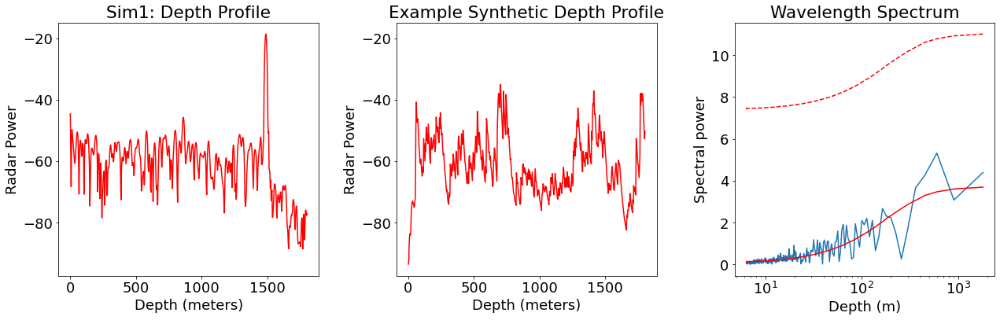

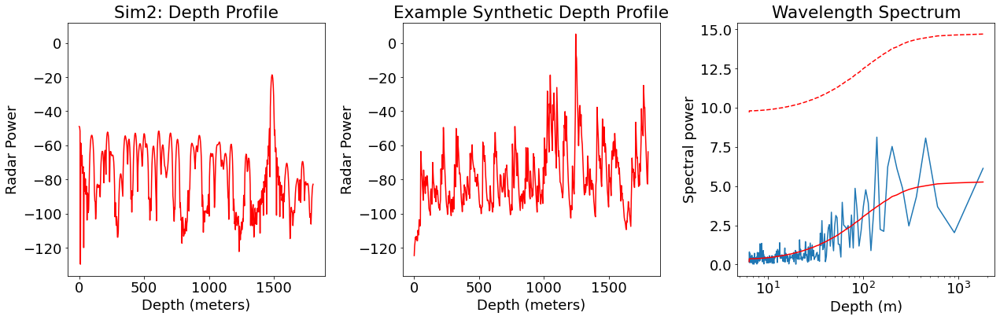

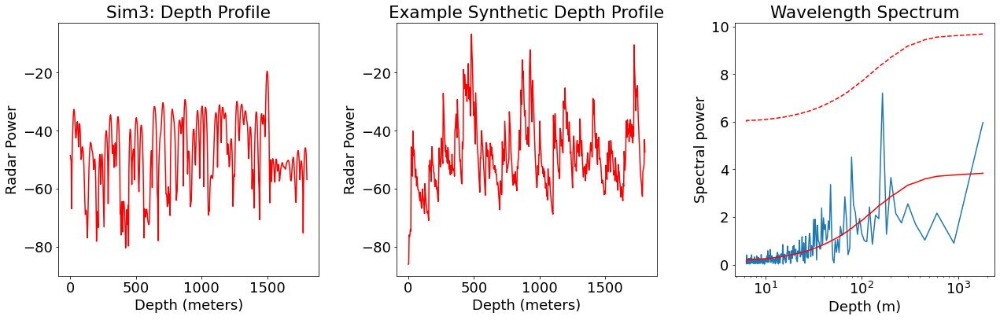

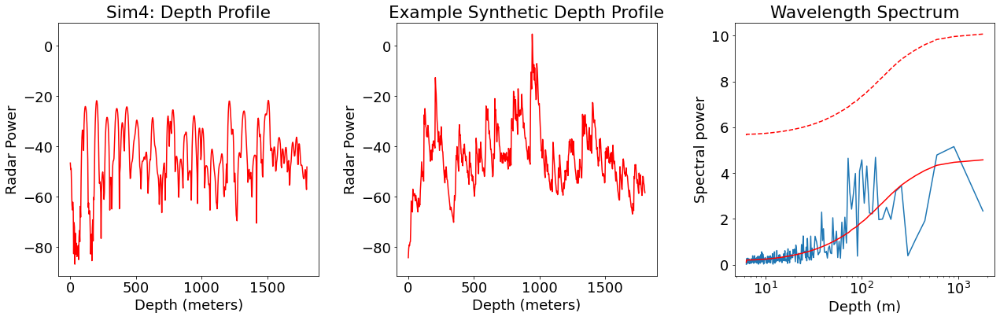

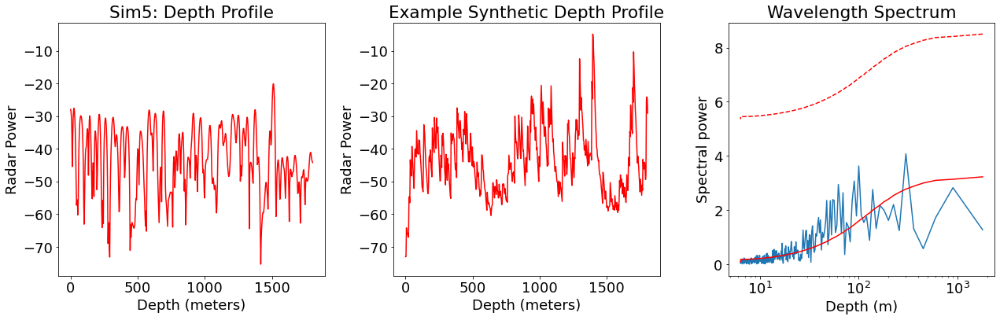

...

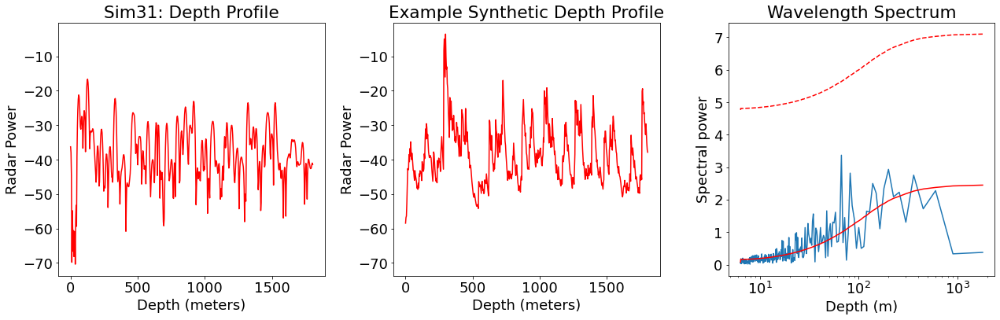

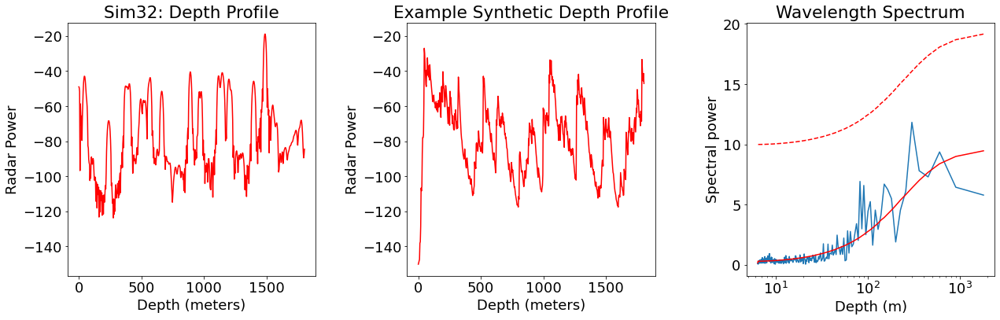

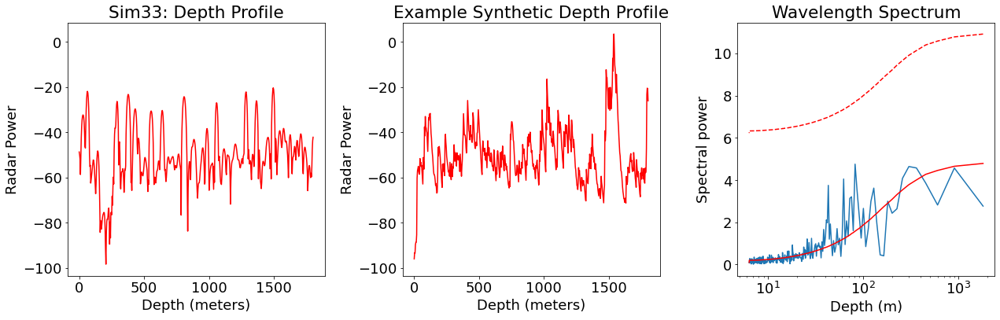

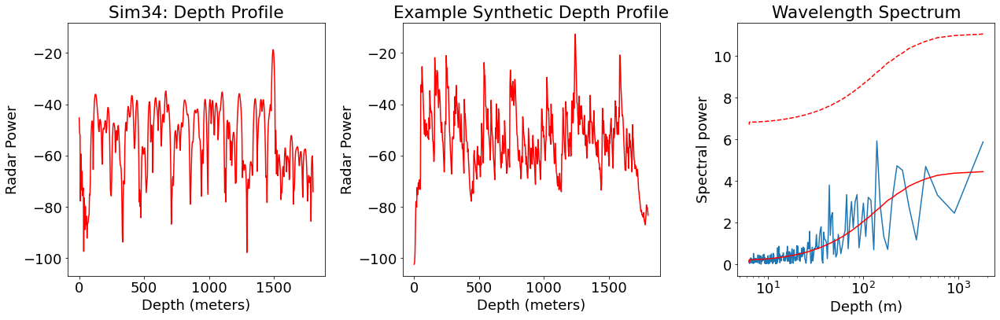

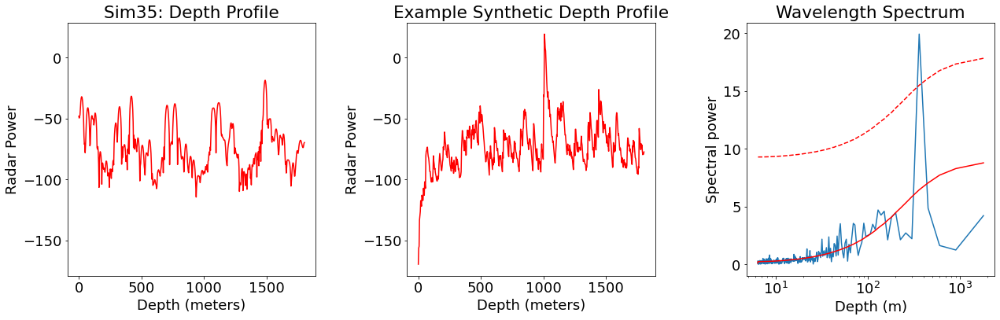

360.6695781996263 19.94191723789419


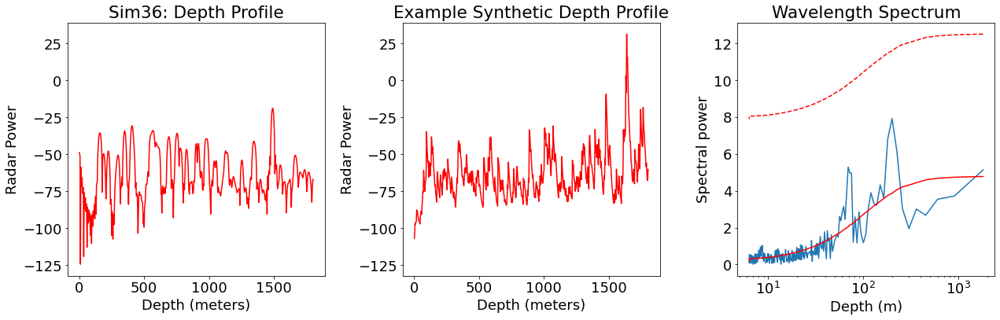

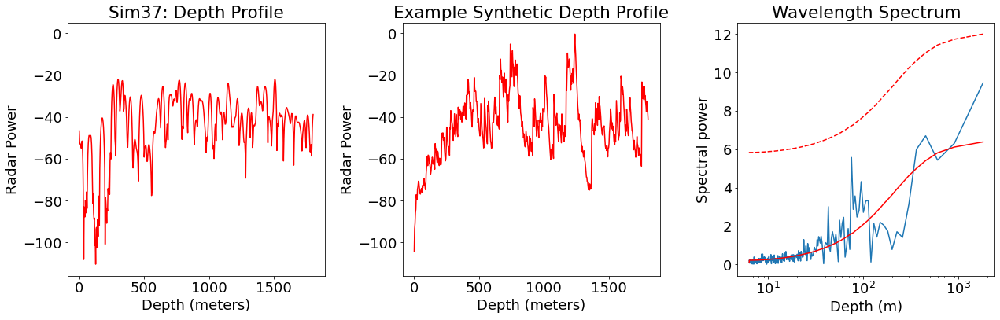

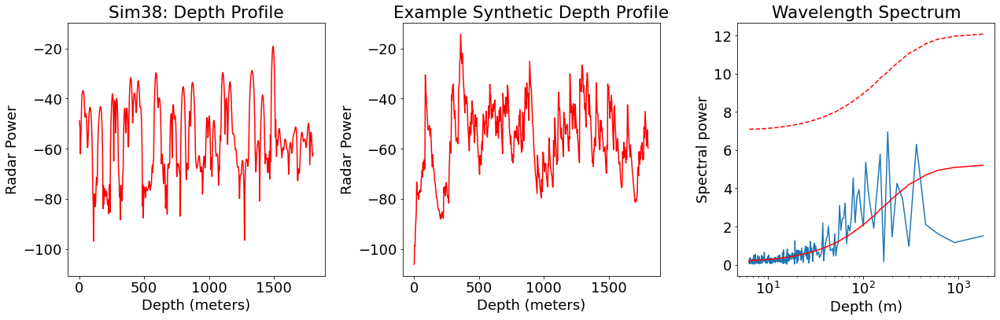

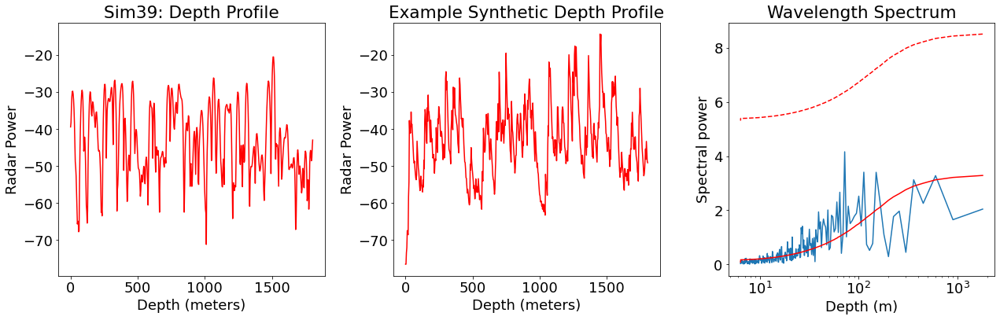

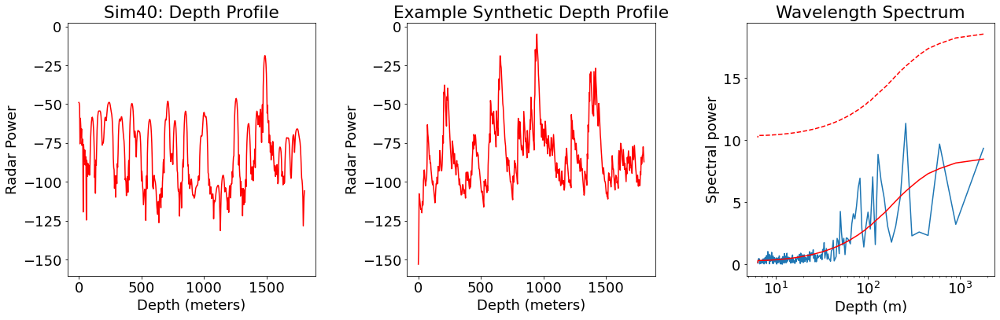

...

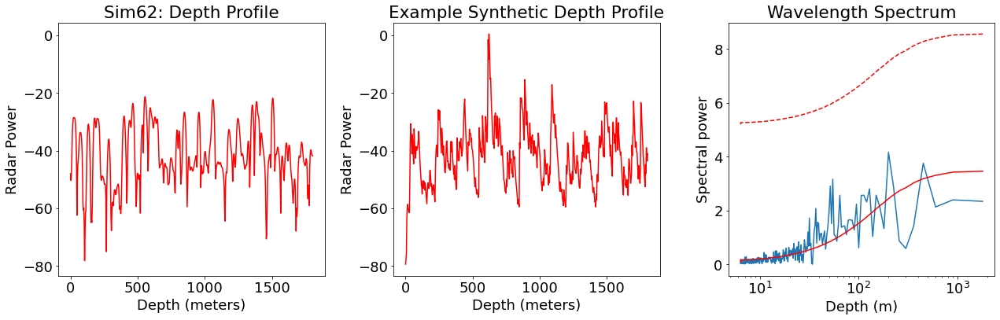

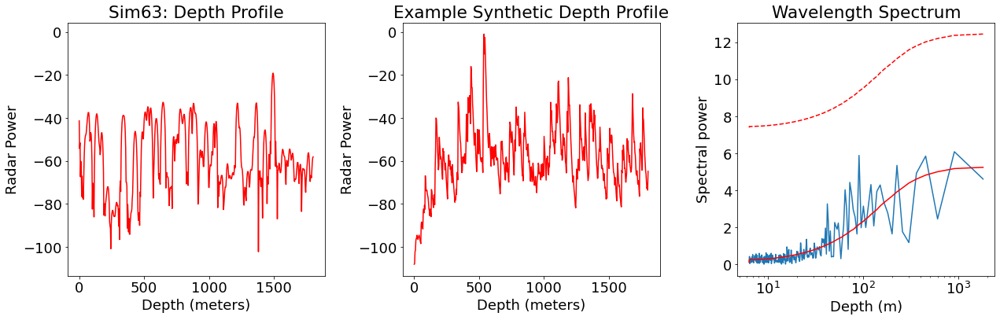

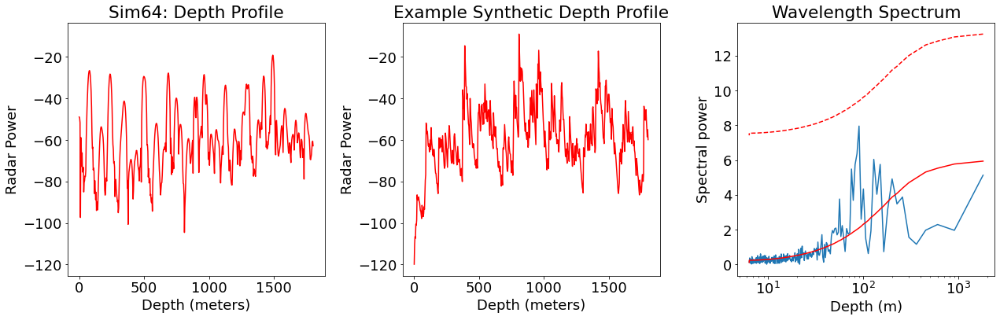

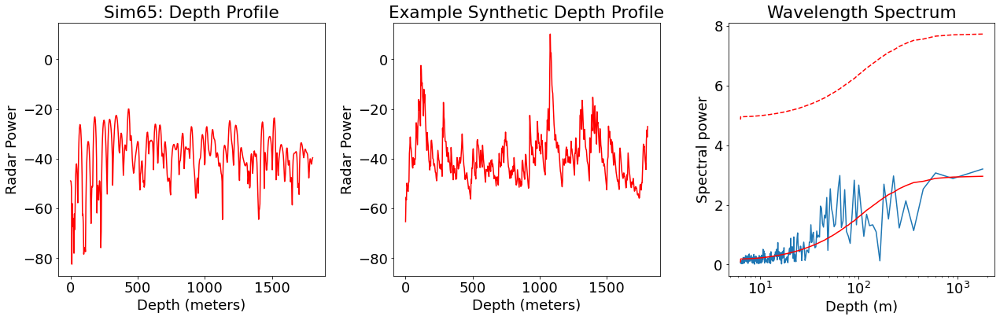

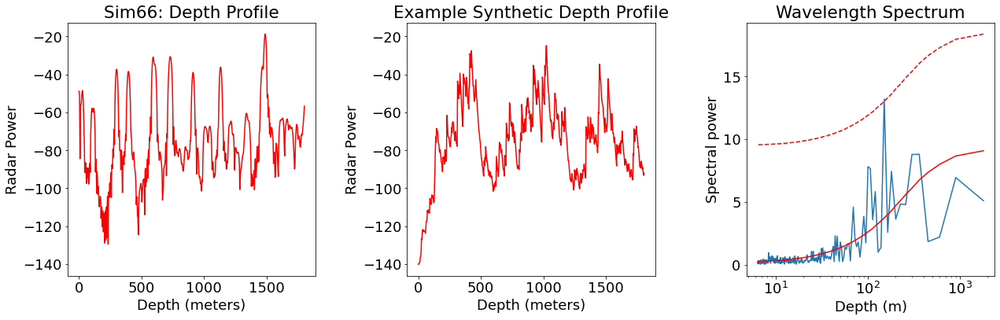

150.27899091651096 13.186720518627949


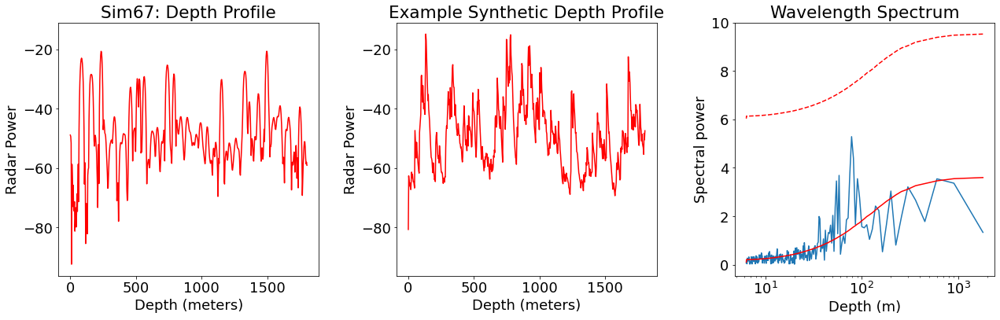

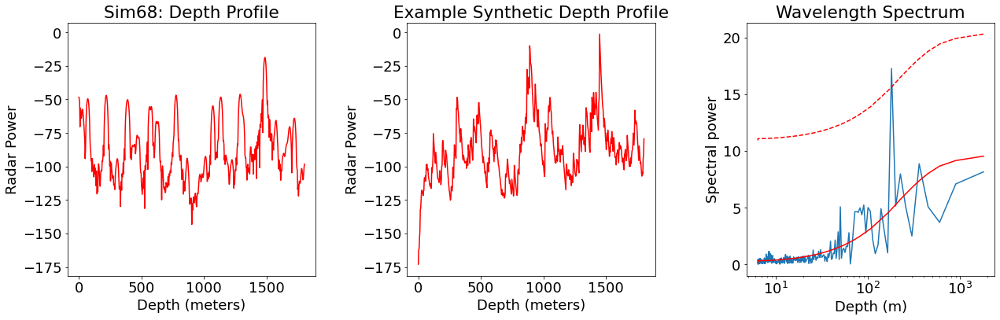

180.33478909981315 17.264615708039475


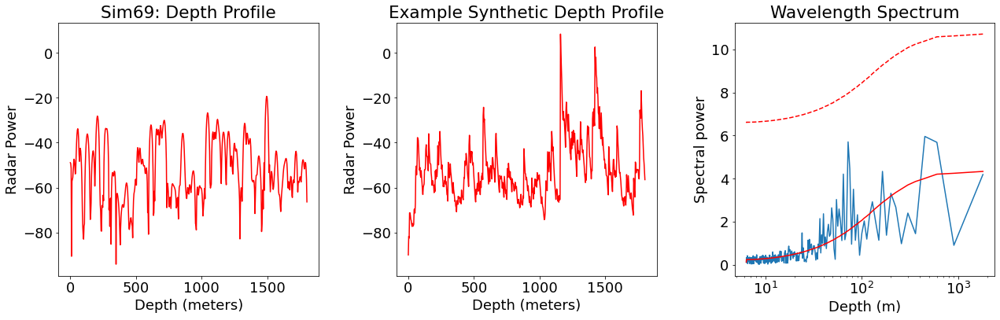

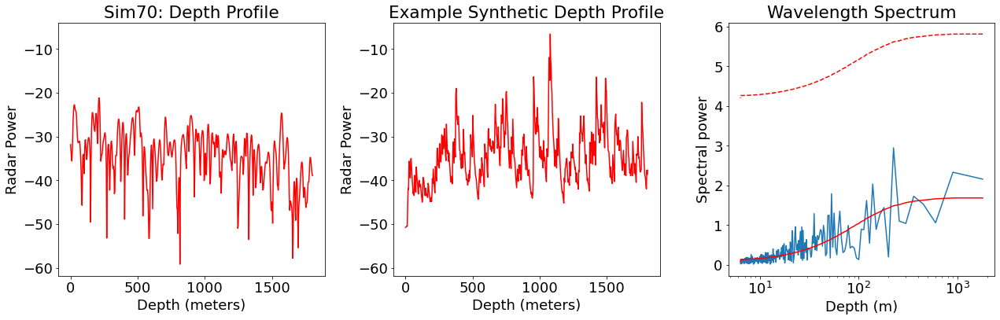

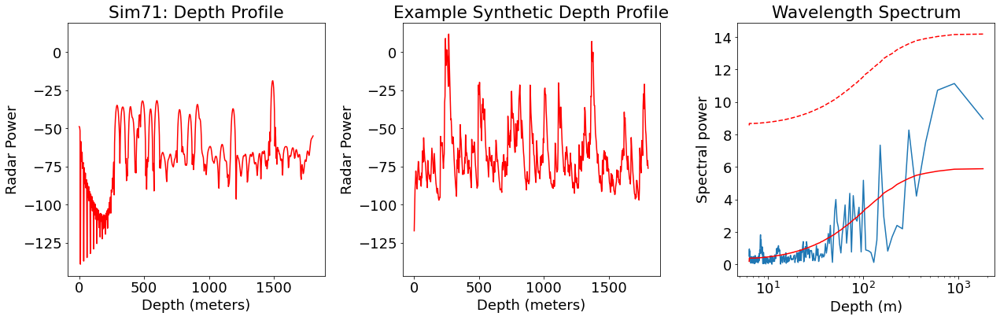

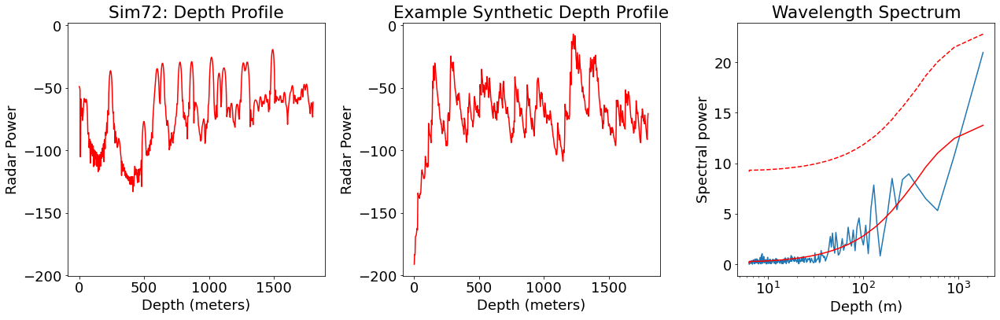

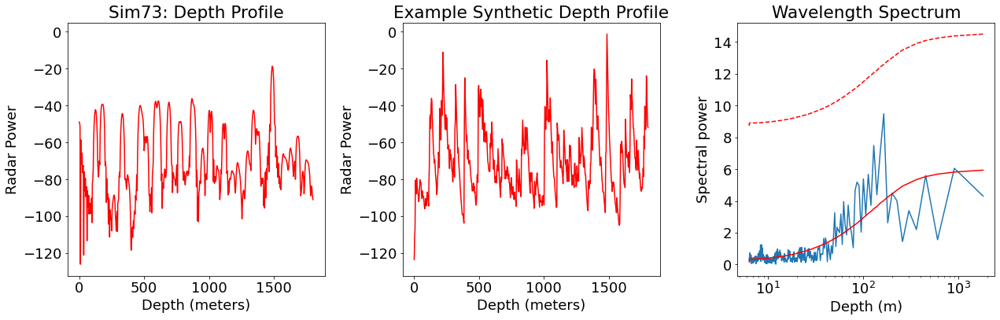

...

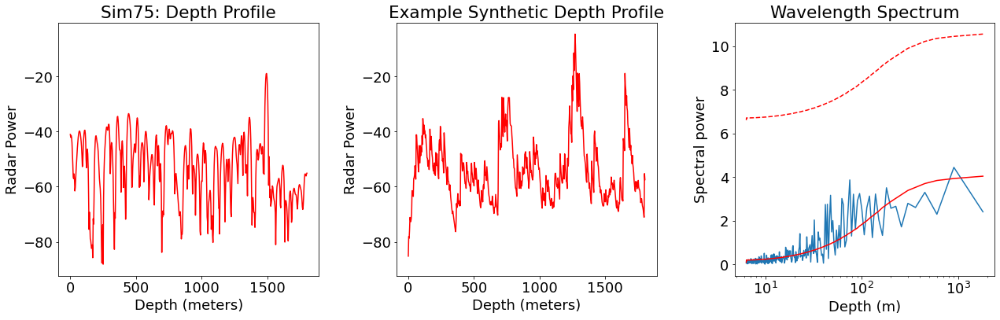

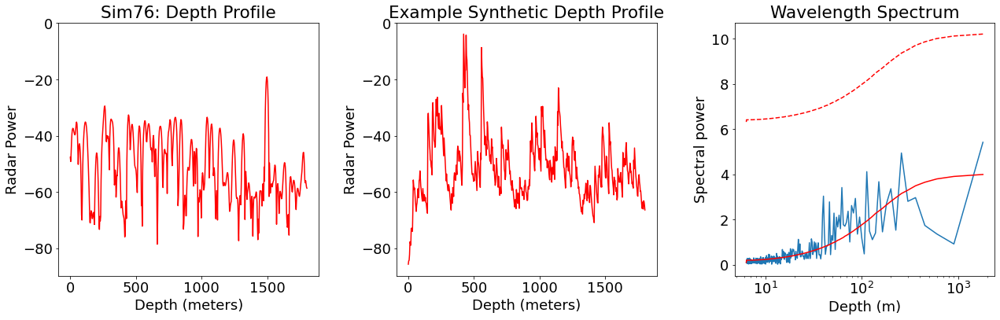

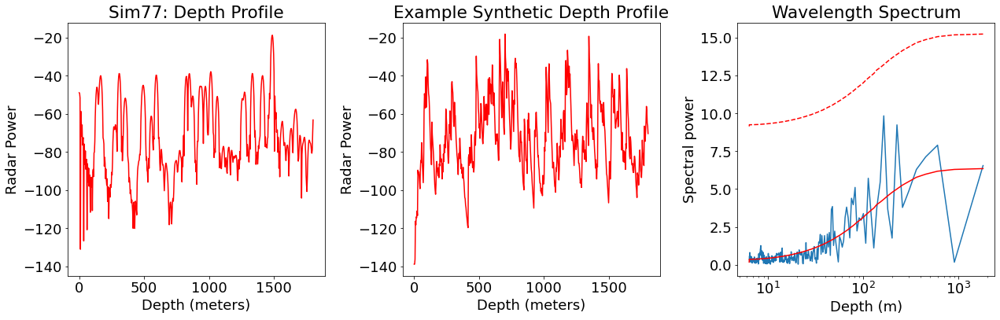

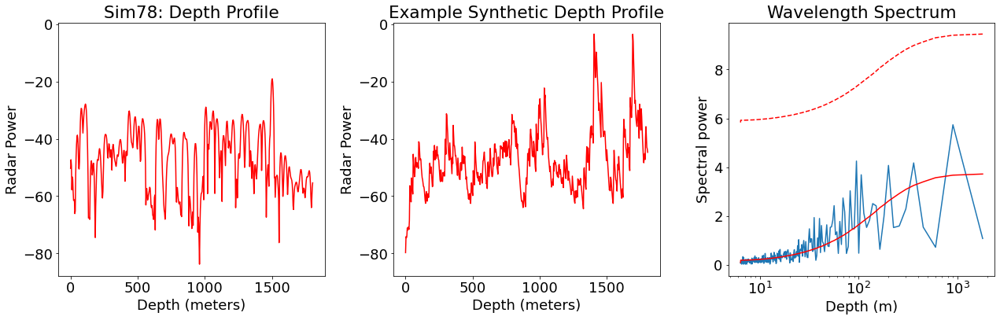

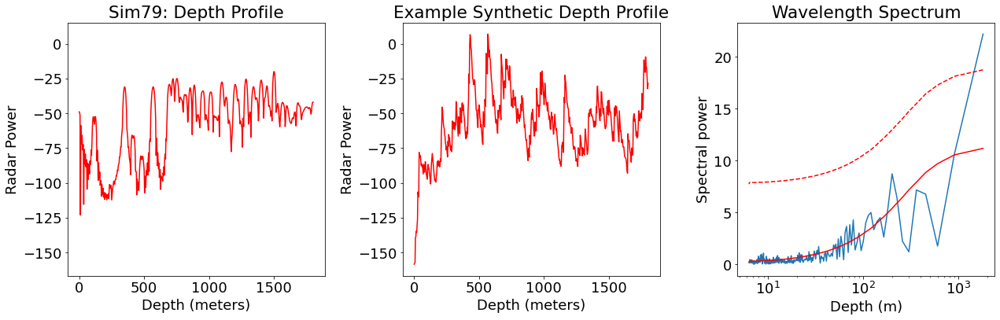

1803.3478909981313 22.175662786085446


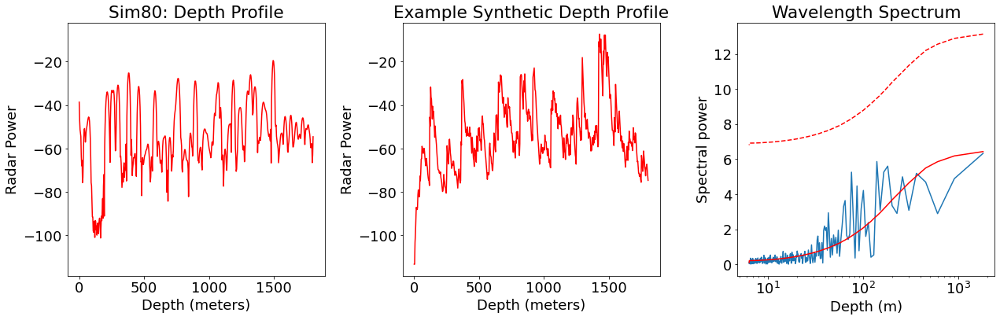

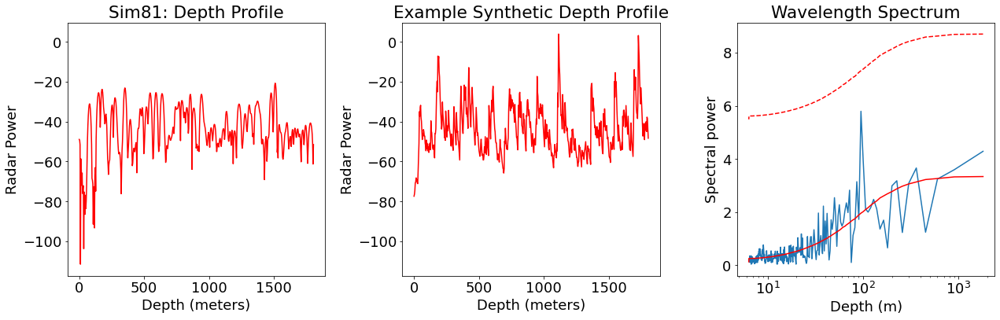

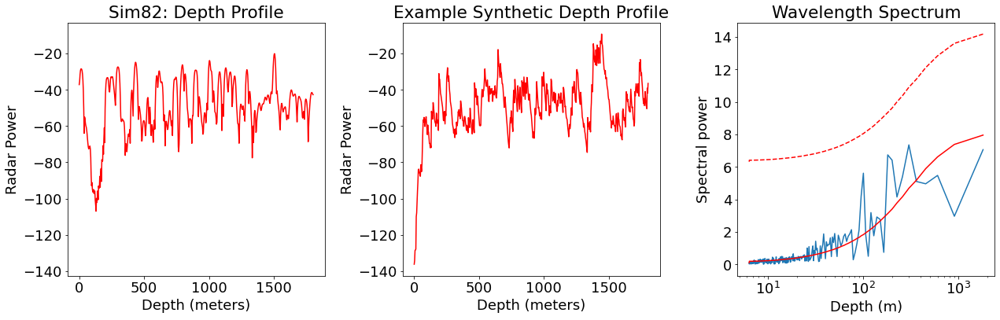

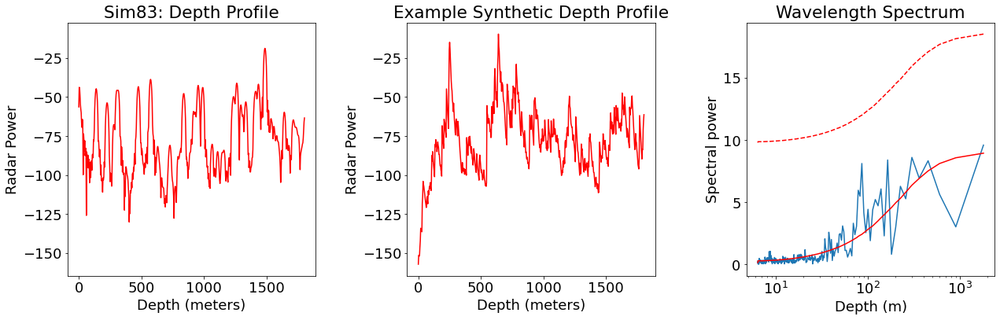

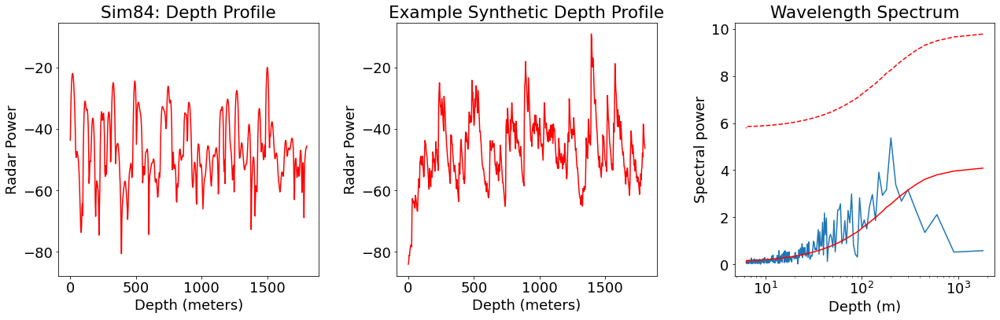

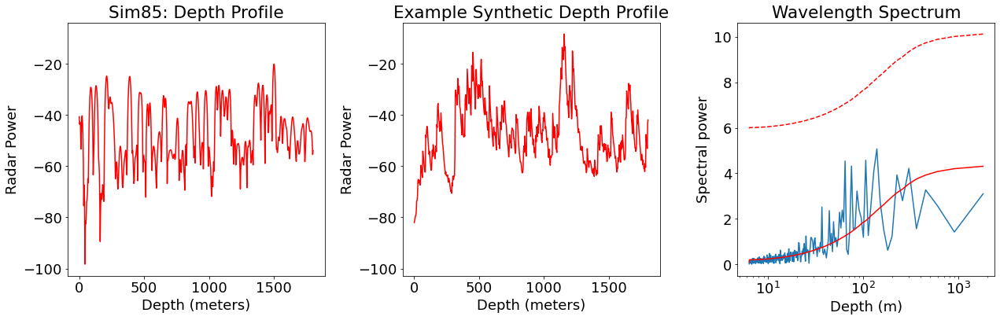

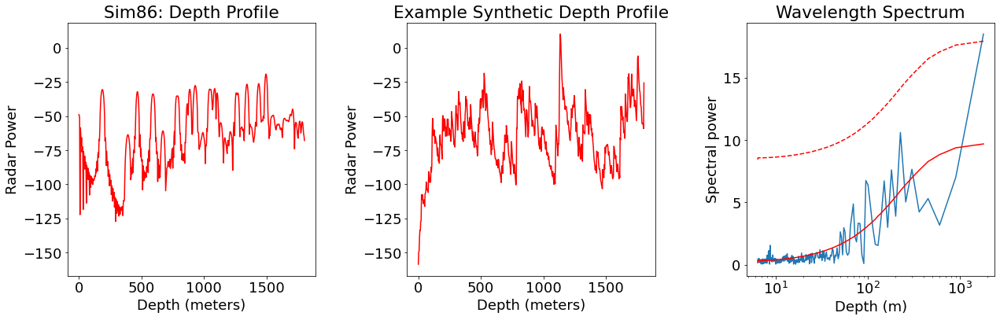

1803.3478909981313 18.493354563659274


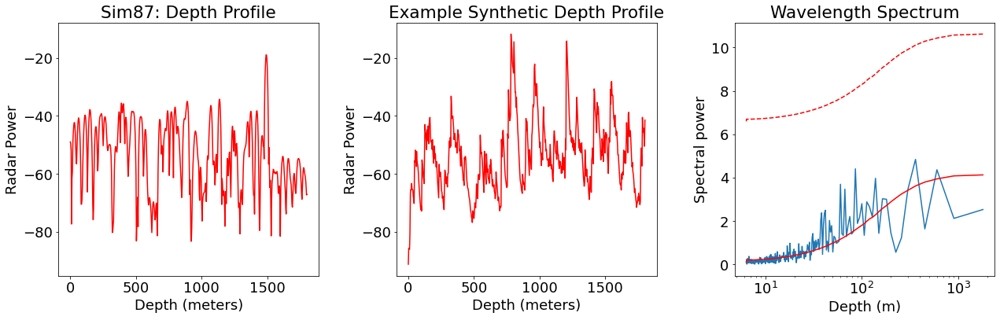

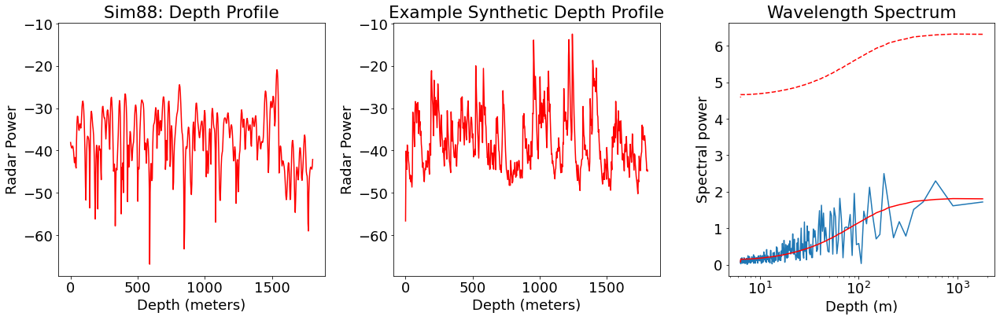

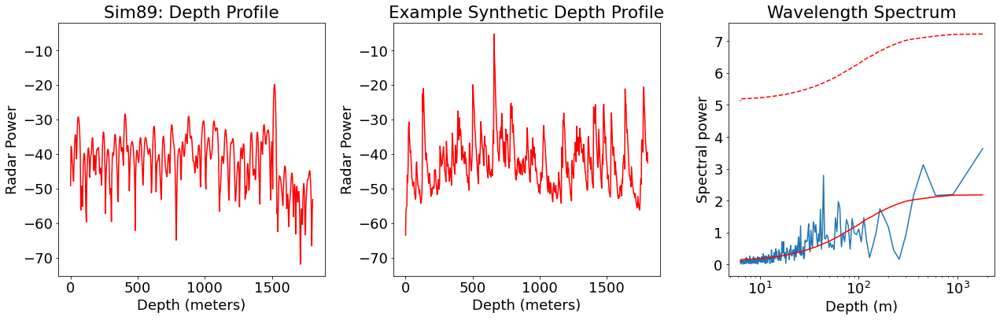

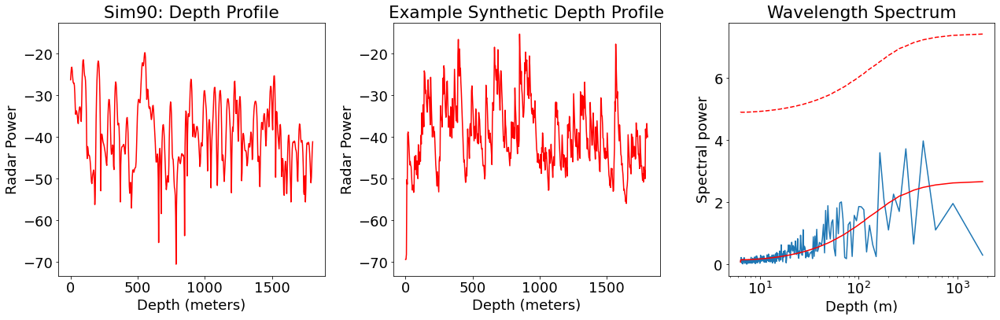

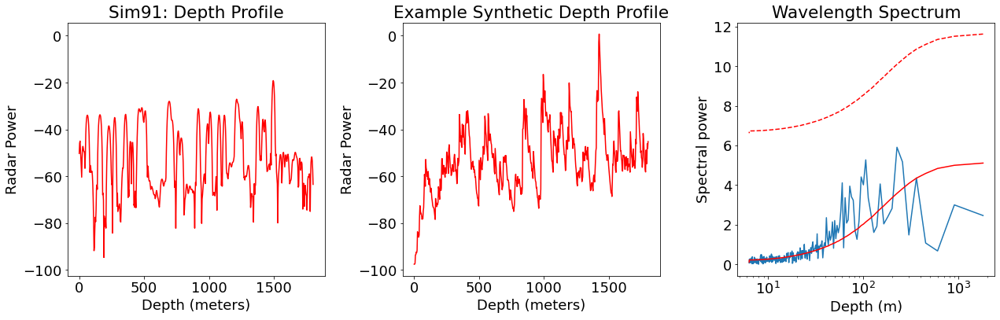

...

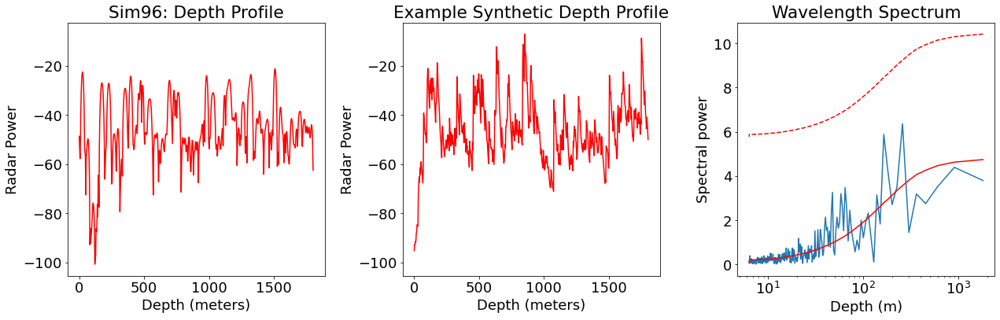

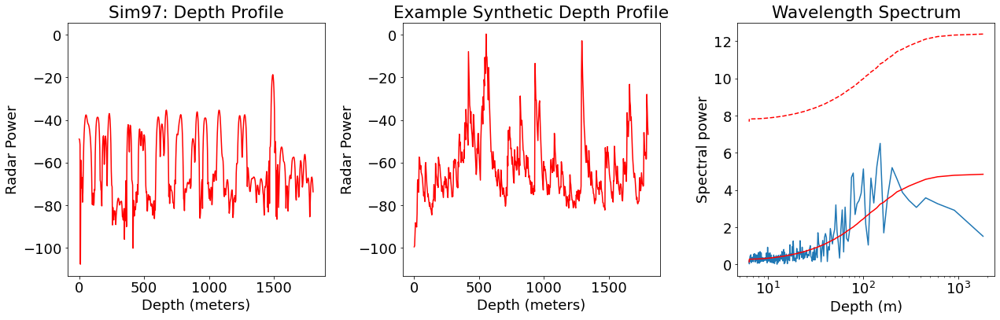

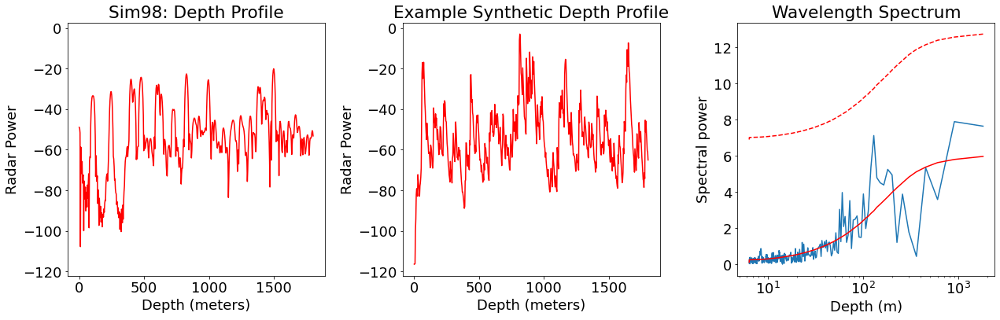

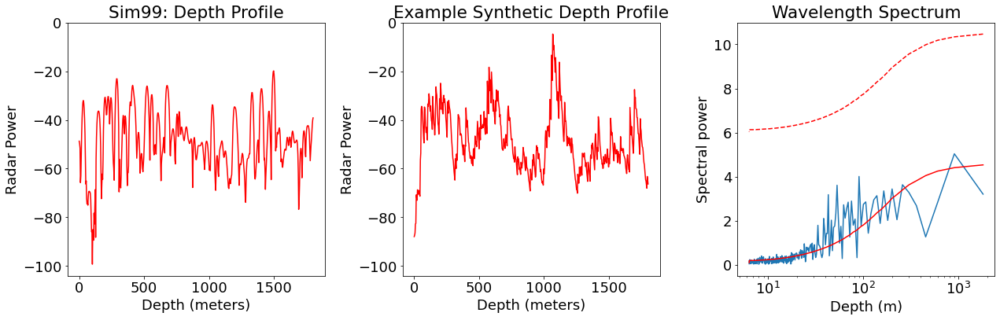

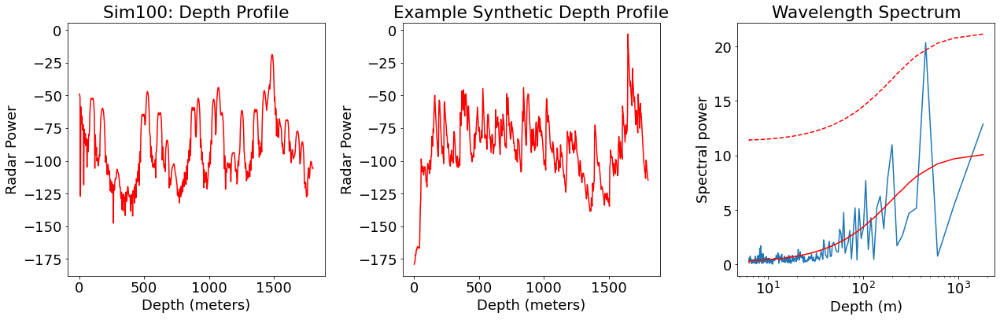

450.83697274953283 20.363780825672556
Number of datasets: 100
Number of significant periodicities


In [5]:
#compute ffts, add red noise lines to each fft plot
sig_period_list = []

for i in column_names: 
    sample_strat = i
    x = csv.Depth_px.to_list()
    y = csv[i].to_list()
    
    peak = y.index(max(y[0:50])) #finds surface return
    surf = x[peak] #location of surface return
    
    x = x[peak+5:]
    y = y[peak+5:]
    
    if len(x) % 2 != 0:
        x.pop()
        y.pop()
        
    #convert pixels to meters
    x = p2m_waterice(x)
    
    ##compute line to fit synthetic data to
    # Skewed Gaussian fit
#     model = SkewedGaussianModel()
#     params = model.make_params(amplitude=(max(y)), center=min(x)+20, sigma=20, gamma=1.5)
#     result = model.fit(y, params, x=x)
#     fit = result.best_fit +np.mean(y[-150:]) # prevents fit from damping out all of the noise on right-handed side

    #run fft 
    w, P1 = fft_radar(x,y)
    
    #Compute monte carlo red noise
    ft = [] #holds fourier transforms for each of 20000 random synthetic records
    syn = []

    for a in range(20000):
        #r=ar1(x,y,fit) #this creates a random synthetic record with similar properties
        r=ar1_nogauss(x,y) #gaussian doesn't seem to fit these synthetic spectra
        syn.append(r)
        w2, p = fft_radar(x,r)
        ft.append(p)
    
    plt.rcParams.update({'font.size': 18})
    #plot depth plot
    plt.figure(figsize = (18, 6))
    plt1 = plt.subplot(131)
    plt1.plot(x, y, 'r')
    #plt1.plot(x, fit, color = 'b') 
    plt1.set_title("Sim"+i+": Depth Profile")
    plt1.set_ylabel('Radar Power')
    plt1.set_xlabel('Depth (meters)')

    #plot example synthetic spectra
    plt2 = plt.subplot(132, sharey=plt1)
    plt2.plot(x, syn[0], 'r')
    #plt2.plot(x, fit, color = 'b')
    plt2.set_title('Example Synthetic Depth Profile')
    plt2.set_ylabel('Radar Power')
    plt2.set_xlabel('Depth (meters)')
    
#     print(np.mean(y))
#     print(np.mean(syn[0]))
#     print(np.var(y))
#     print(np.var(syn[0]))
    
    #plot spectrum
    plt3 = plt.subplot(133)
    plt3.plot(w, P1)
    plt3.plot(w,np.mean(ft, axis=0), 'r')
    plt3.plot(w,np.mean(ft, axis=0)+2*np.std(ft),'r',ls='dashed')
    plt3.set_title('Wavelength Spectrum')

    plt3.set_xscale('log')
    plt3.set_xlabel('Depth (m)')
    plt3.set_ylabel('Spectral power') #units are whatever JMARS reports, I have to look into this
    plt.tight_layout()
    plt.show()
    
    sig = np.mean(ft, axis=0)+2*np.std(ft)

    
    for j in range(len(P1)):
        if P1[j] > sig[j]:
            print(w[j], P1[j])
            sig_period_list.append(i)

sig_period_list = list(set(sig_period_list))

print("Number of datasets: " +str(len(column_names)))
print("Number of significant periodicities: " +len(sig_period_list))
print("Simulations with significant periodicities:" +str(sig_period_list))


In [6]:
print(sig_period_list)
sig_period_list = list(set(sig_period_list))
print(sig_period_list)



['100']
['100']
